In [5]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/imageprocessing/img_2.png
/kaggle/input/imageprocessing/img_1.png


# 🧠 Image Processing Practicals using Python (OpenCV & Scikit-Image)

This notebook contains all image processing practicals performed using **Python**.

---

### 📚 Course Information

**Subject:** Image Processing Practicals  
**Conducted In:** Python (OpenCV + Scikit-Image)  
**Platform:** Kaggle  

---

### 👨‍🎓 Student Details

**Name:** Raunak Kumar  
**Roll No:** 22/28089  
**College:** Aatmaram Sanatan Dharma College  

---

### 🧩 Libraries Used
- OpenCV (`cv2`)
- NumPy
- Matplotlib
- Scikit-Image

---

### 📝 Description
All tasks are executed **step-by-step** as per the practical list, covering:
- Basic Image Operations  
- Point Processing  
- Image Arithmetic  
- Logical Operations  
- Histogram Equalization  
- Geometric Transformations  
- Noise Addition & Restoration  
- Spatial and Frequency Filtering  
- Edge Detection  
- Morphological Operations  

---

✅ *Developed and tested on Kaggle (Python 3 environment)*


In [9]:
# Import required libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure, util, filters, morphology, restoration


In [11]:
# Load sample images
img = cv2.imread('/kaggle/input/imageprocessing/img_1.png')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img2 = cv2.imread('/kaggle/input/imageprocessing/img_2.png')
img2 = cv2.resize(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB), img_rgb.shape[1::-1])


## 🧩 1. BASIC IMAGE OPERATIONS (a–g)

This practical demonstrates basic manipulations on digital images.

**Operations performed:**
- Displaying an image  
- Resizing  
- Converting to grayscale  
- Converting to black & white (binary)  
- Extracting image profile (pixel intensity graph)  
- Separating RGB channels  
- Merging RGB channels back together  


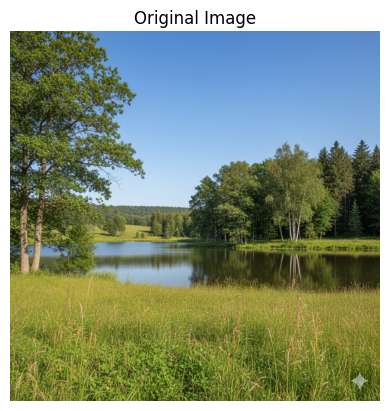

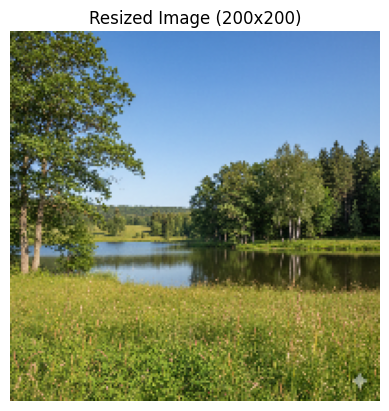

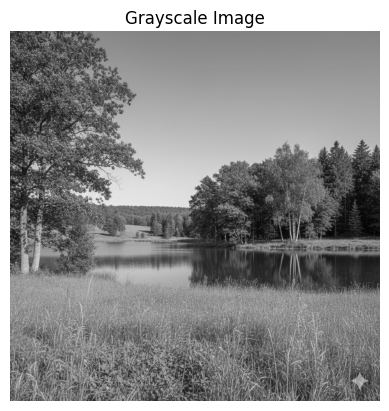

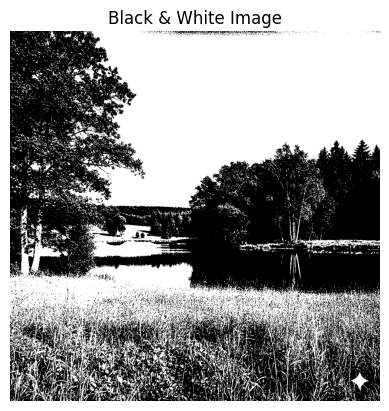

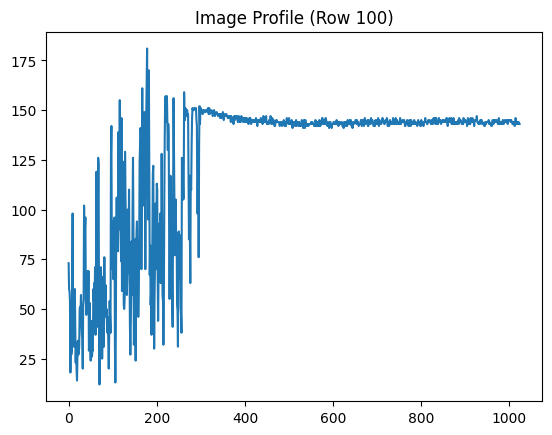

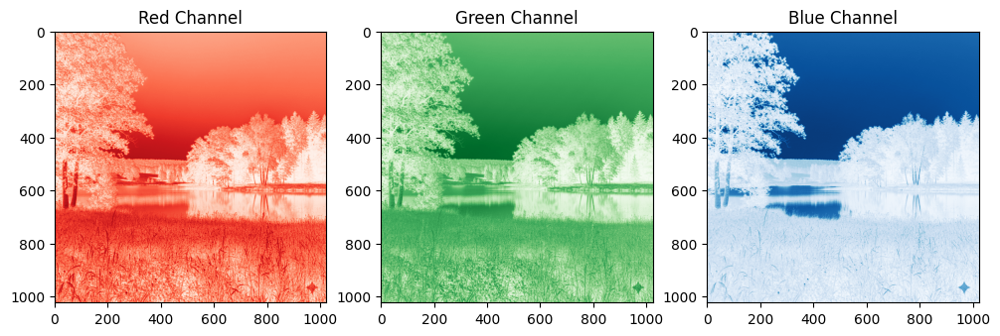

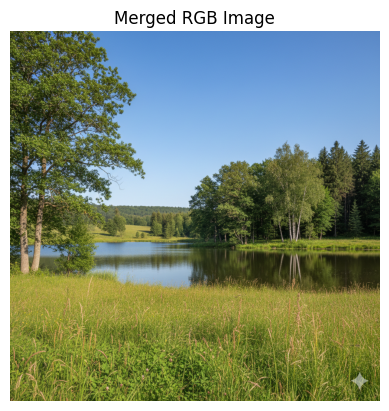

In [12]:
# ============================================================
# 1. BASIC IMAGE OPERATIONS
# ============================================================

# a. Display Image
plt.imshow(img_rgb)
plt.title("Original Image")
plt.axis('off')
plt.show()

# b. Resize Image
resized = cv2.resize(img_rgb, (200, 200))
plt.imshow(resized)
plt.title("Resized Image (200x200)")
plt.axis('off')
plt.show()

# c. Grayscale
gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
plt.imshow(gray, cmap='gray')
plt.title("Grayscale Image")
plt.axis('off')
plt.show()

# d. Black & White
_, bw = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
plt.imshow(bw, cmap='gray')
plt.title("Black & White Image")
plt.axis('off')
plt.show()

# e. Image Profile
plt.plot(gray[100])
plt.title("Image Profile (Row 100)")
plt.show()

# f. Separate RGB
r, g, b = cv2.split(img_rgb)
fig, ax = plt.subplots(1,3, figsize=(12,4))
ax[0].imshow(r, cmap='Reds'); ax[0].set_title('Red Channel')
ax[1].imshow(g, cmap='Greens'); ax[1].set_title('Green Channel')
ax[2].imshow(b, cmap='Blues'); ax[2].set_title('Blue Channel')
plt.show()

# g. Merge RGB
merged = cv2.merge([r,g,b])
plt.imshow(merged)
plt.title("Merged RGB Image")
plt.axis('off')
plt.show()


## 🎚️ 2. POINT PROCESSING (a–d)

These operations modify pixel values individually without considering their neighbors.

**Operations performed:**
- Negative transformation  
- Image flipping (mirror effect)  
- Thresholding  
- Contrast stretching  

**Objective:**  
To observe how pixel intensity transformations affect overall image appearance.

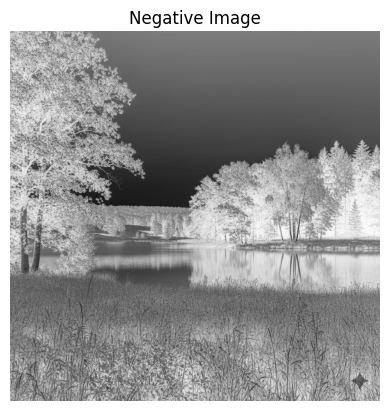

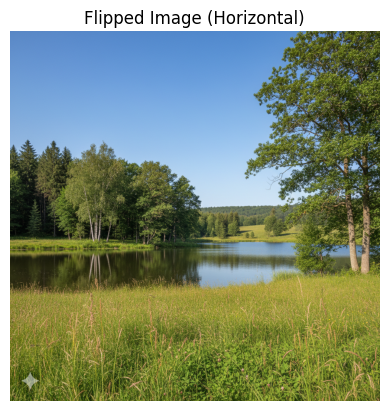

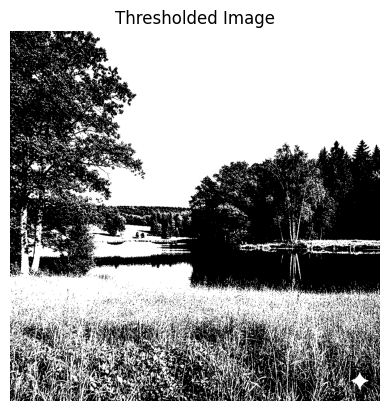

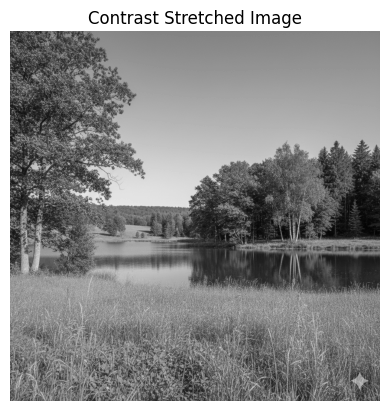

In [13]:
# ============================================================
# 2. POINT PROCESSING
# ============================================================

# a. Negative
negative = 255 - gray
plt.imshow(negative, cmap='gray')
plt.title("Negative Image")
plt.axis('off')
plt.show()

# b. Flip
flipped = cv2.flip(img_rgb, 1)
plt.imshow(flipped)
plt.title("Flipped Image (Horizontal)")
plt.axis('off')
plt.show()

# c. Thresholding
_, th = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY)
plt.imshow(th, cmap='gray')
plt.title("Thresholded Image")
plt.axis('off')
plt.show()

# d. Contrast Stretching
min_val, max_val = np.min(gray), np.max(gray)
stretched = ((gray - min_val) / (max_val - min_val)) * 255
plt.imshow(stretched, cmap='gray')
plt.title("Contrast Stretched Image")
plt.axis('off')
plt.show()

## ➕ 3. IMAGE ARITHMETIC (a–d)

Perform mathematical operations between two images.

**Operations performed:**
- Image addition  
- Image subtraction  
- Mean pixel value calculation  
- Brightness adjustment  

**Objective:**  
To understand arithmetic combination of image matrices and brightness control.

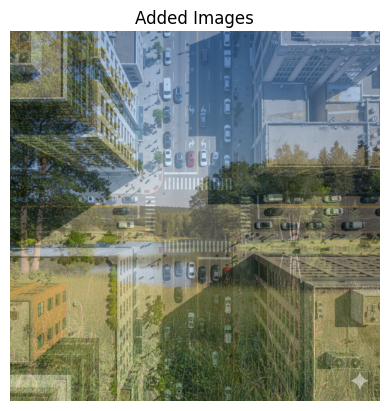

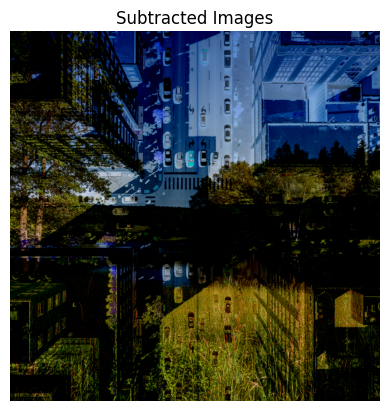

Mean Pixel Value: 118.6939868927002


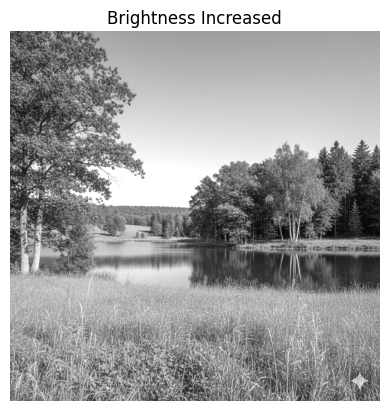

In [14]:
# ============================================================
# 3. IMAGE ARITHMETIC
# ============================================================

# a. Addition
add_img = cv2.addWeighted(img_rgb, 0.5, img2, 0.5, 0)
plt.imshow(add_img)
plt.title("Added Images")
plt.axis('off')
plt.show()

# b. Subtraction
sub_img = cv2.subtract(img_rgb, img2)
plt.imshow(sub_img)
plt.title("Subtracted Images")
plt.axis('off')
plt.show()

# c. Mean Calculation
mean_val = np.mean(gray)
print("Mean Pixel Value:", mean_val)

# d. Brightness Change
bright = cv2.convertScaleAbs(gray, alpha=1, beta=50)
plt.imshow(bright, cmap='gray')
plt.title("Brightness Increased")
plt.axis('off')
plt.show()


## 🔲 4. LOGICAL OPERATIONS

Perform logical (bitwise) operations between two binary images.

**Operations performed:**
- AND  
- OR  
- XOR (useful for watermarking)  
- NOT  
- Intersection  

**Objective:**  
To apply logical operations on images for masking and region extraction.

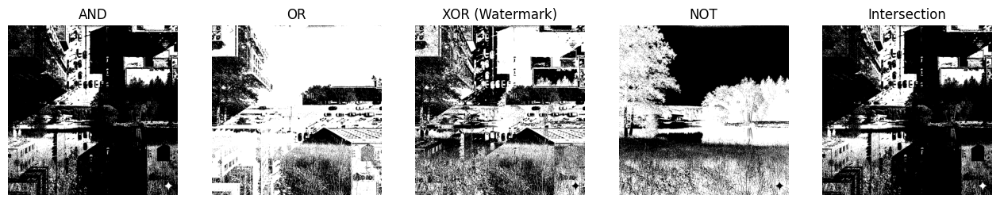

In [16]:
# ============================================================
# 4. LOGICAL OPERATIONS
# ============================================================

# Convert to binary
img1_bw = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
img2_bw = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
_, img1_bw = cv2.threshold(img1_bw, 127, 255, cv2.THRESH_BINARY)
_, img2_bw = cv2.threshold(img2_bw, 127, 255, cv2.THRESH_BINARY)

and_img = cv2.bitwise_and(img1_bw, img2_bw)
or_img = cv2.bitwise_or(img1_bw, img2_bw)
xor_img = cv2.bitwise_xor(img1_bw, img2_bw)
not_img = cv2.bitwise_not(img1_bw)
intersect = cv2.bitwise_and(img1_bw, img2_bw)

fig, ax = plt.subplots(1,5, figsize=(16,4))
titles = ['AND','OR','XOR (Watermark)','NOT','Intersection']
images = [and_img, or_img, xor_img, not_img, intersect]
for i in range(5):
    ax[i].imshow(images[i], cmap='gray')
    ax[i].set_title(titles[i])
    ax[i].axis('off')
plt.show()

## 📊 5. HISTOGRAM CALCULATION & EQUALIZATION

Analyze and enhance image contrast using histograms.

**Operations performed:**
- Histogram plotting (using inbuilt function)  
- Histogram equalization (inbuilt)  
- Histogram equalization (manual computation)  

**Objective:**  
To visualize and improve image contrast by redistributing intensity levels.

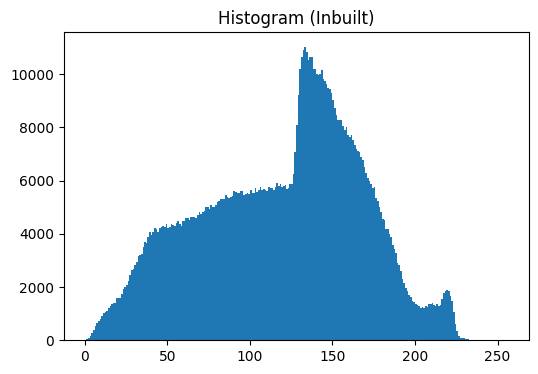

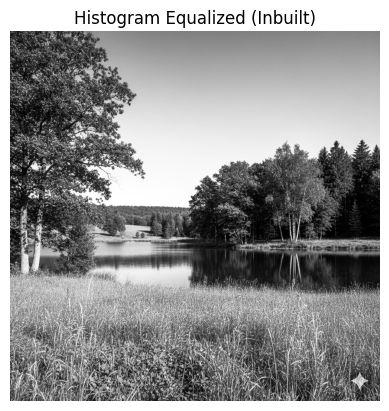

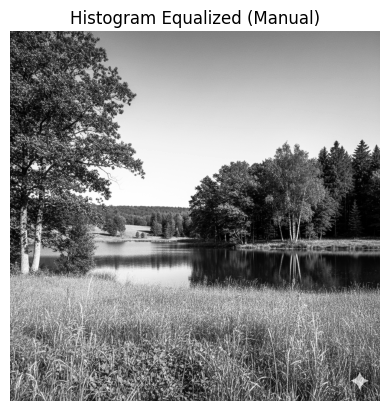

In [17]:
# ============================================================
# 5. HISTOGRAM CALCULATION & EQUALIZATION
# ============================================================

# a. Using inbuilt function
plt.figure(figsize=(6,4))
plt.hist(gray.ravel(), 256, [0,256])
plt.title("Histogram (Inbuilt)")
plt.show()

# Histogram Equalization (inbuilt)
eq_img = cv2.equalizeHist(gray)
plt.imshow(eq_img, cmap='gray')
plt.title("Histogram Equalized (Inbuilt)")
plt.axis('off')
plt.show()

# b. Manual equalization
hist, bins = np.histogram(gray.flatten(), 256, [0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max() / cdf.max()
cdf_m = np.ma.masked_equal(cdf,0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf_final = np.ma.filled(cdf_m,0).astype('uint8')
img_eq_manual = cdf_final[gray]
plt.imshow(img_eq_manual, cmap='gray')
plt.title("Histogram Equalized (Manual)")
plt.axis('off')
plt.show()


## 🌀 6. GEOMETRIC TRANSFORMATIONS

Apply geometric changes to images.

**Operations performed:**
- Translation (moving image position)  
- Scaling (resizing up/down)  
- Rotation (45°)  
- Shrinking  
- Zooming  

**Objective:**  
To study how geometric transformations alter the spatial positioning of image pixels.

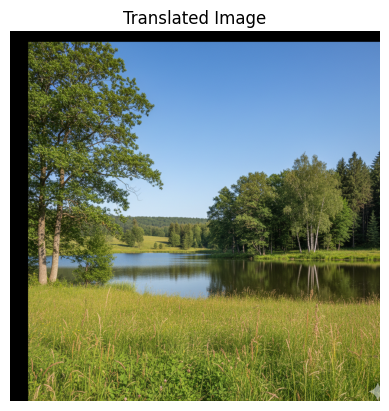

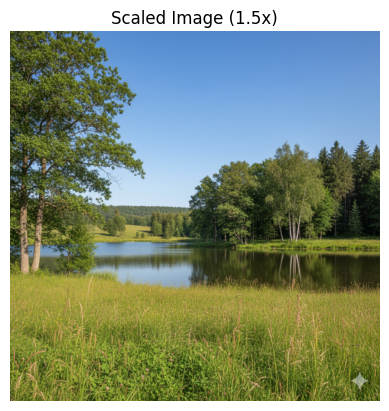

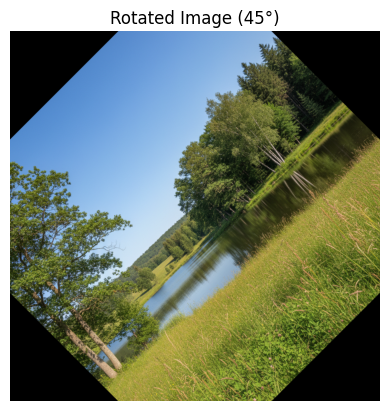

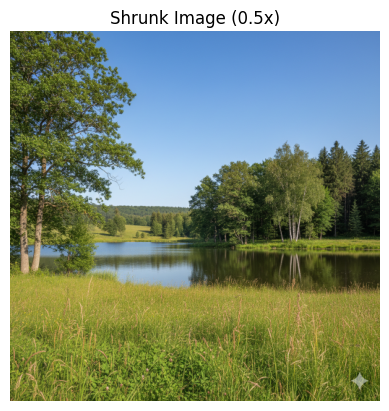

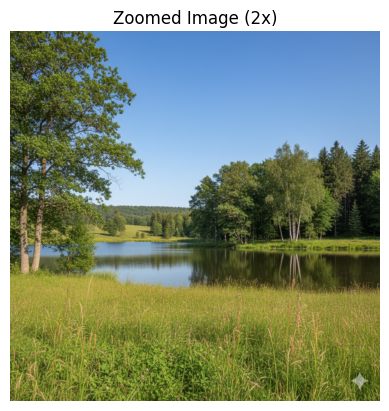

In [18]:
# ============================================================
# 6. GEOMETRIC TRANSFORMATIONS
# ============================================================

rows, cols = gray.shape

# a. Translation
M = np.float32([[1,0,50],[0,1,30]])
translated = cv2.warpAffine(img_rgb, M, (cols, rows))
plt.imshow(translated)
plt.title("Translated Image")
plt.axis('off')
plt.show()

# b. Scaling
scaled = cv2.resize(img_rgb, None, fx=1.5, fy=1.5)
plt.imshow(scaled)
plt.title("Scaled Image (1.5x)")
plt.axis('off')
plt.show()

# c. Rotation
M = cv2.getRotationMatrix2D((cols/2, rows/2), 45, 1)
rotated = cv2.warpAffine(img_rgb, M, (cols, rows))
plt.imshow(rotated)
plt.title("Rotated Image (45°)")
plt.axis('off')
plt.show()

# d. Shrinking
shrunk = cv2.resize(img_rgb, None, fx=0.5, fy=0.5)
plt.imshow(shrunk)
plt.title("Shrunk Image (0.5x)")
plt.axis('off')
plt.show()

# e. Zooming
zoomed = cv2.resize(img_rgb, None, fx=2, fy=2)
plt.imshow(zoomed)
plt.title("Zoomed Image (2x)")
plt.axis('off')
plt.show()


## 🎛️ 7. IMAGE NOISE & RESTORATION

Simulate and remove noise from images.

**Operations performed:**
- Adding salt & pepper noise  
- Removing salt & pepper noise (median filter)  
- Adding Gaussian noise  
- Removing Gaussian noise (Wiener / Wavelet filter)  

**Objective:**  
To understand image degradation and restoration through filtering techniques.

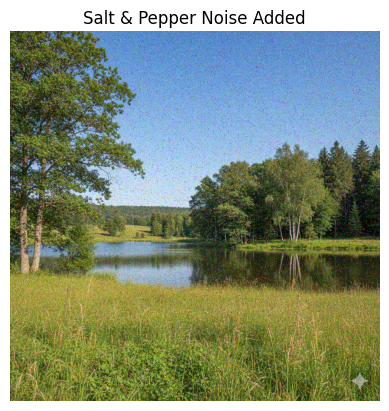

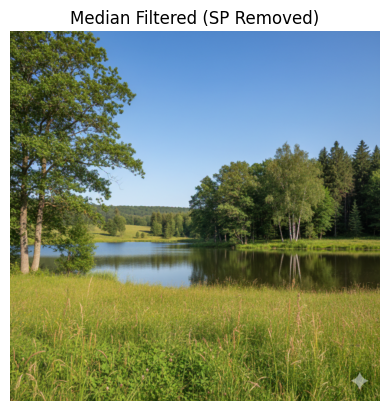

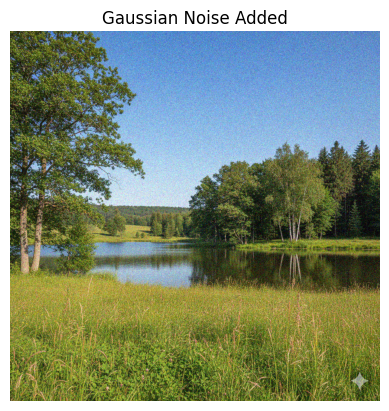

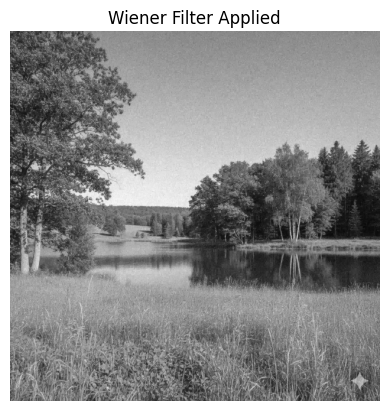

In [24]:
# ============================================================
# 7. IMAGE NOISE & RESTORATION
# ============================================================

# a. Add Salt & Pepper Noise
sp_noise = util.random_noise(img_rgb, mode='s&p', amount=0.05)
plt.imshow(sp_noise)
plt.title("Salt & Pepper Noise Added")
plt.axis('off')
plt.show()

# b. Remove Salt & Pepper (Median Filter)
median_filtered = cv2.medianBlur((sp_noise*255).astype('uint8'), 3)
plt.imshow(median_filtered)
plt.title("Median Filtered (SP Removed)")
plt.axis('off')
plt.show()

# c. Add Gaussian Noise
gaussian_noise = util.random_noise(img_rgb, mode='gaussian', var=0.01)
plt.imshow(gaussian_noise)
plt.title("Gaussian Noise Added")
plt.axis('off')
plt.show()

# d. Remove Gaussian Noise (Wiener Filter)
gray_noisy = cv2.cvtColor((gaussian_noise*255).astype('uint8'), cv2.COLOR_RGB2GRAY)
wiener_filtered = restoration.denoise_wavelet(gray_noisy, channel_axis=None)
plt.imshow(wiener_filtered, cmap='gray')
plt.title("Wiener Filter Applied")
plt.axis('off')
plt.show()

## 🎚️ 8. SPATIAL FILTERING

Enhance or smooth images using spatial filters.

**Operations performed:**
- Low pass filtering (smoothing)  
- High pass filtering (edge enhancement)  

**Objective:**  
To explore convolution-based image filtering and its effects on detail preservation.

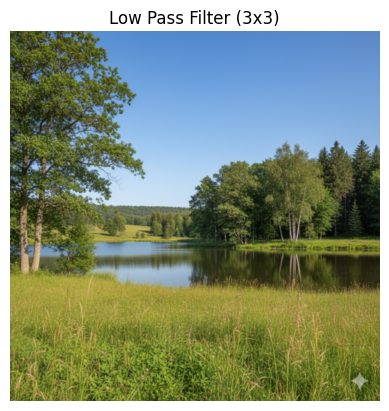

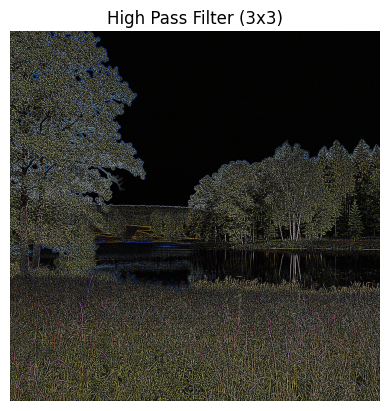

In [20]:
# ============================================================
# 8. SPATIAL FILTERING
# ============================================================

# a. 1D & 2D Convolution (Low Pass)
kernel_low = np.ones((3,3), np.float32)/9
low_pass = cv2.filter2D(img_rgb, -1, kernel_low)
plt.imshow(low_pass)
plt.title("Low Pass Filter (3x3)")
plt.axis('off')
plt.show()

# b. High Pass Filter
kernel_high = np.array([[-1,-1,-1], [-1,8,-1], [-1,-1,-1]])
high_pass = cv2.filter2D(img_rgb, -1, kernel_high)
plt.imshow(high_pass)
plt.title("High Pass Filter (3x3)")
plt.axis('off')
plt.show()


## ⚡ 9. FREQUENCY DOMAIN FILTERING

Process images in the frequency domain using FFT.

**Operations performed:**
- Fourier Transform and magnitude spectrum visualization  
- Low pass filtering via frequency mask  

**Objective:**  
To observe how frequency components affect image clarity and smoothness.

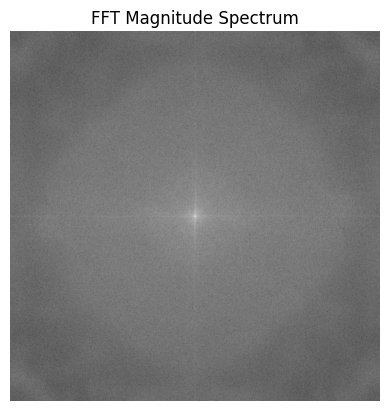

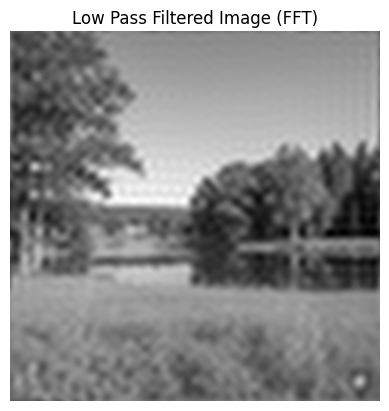

In [21]:
# ============================================================
# 9. FREQUENCY DOMAIN FILTERING
# ============================================================

# Convert to grayscale
f_gray = gray.astype('float32')
f = np.fft.fft2(f_gray)
fshift = np.fft.fftshift(f)
magnitude = 20*np.log(np.abs(fshift))

plt.imshow(magnitude, cmap='gray')
plt.title("FFT Magnitude Spectrum")
plt.axis('off')
plt.show()

# Low pass mask
rows, cols = gray.shape
crow, ccol = rows//2 , cols//2
mask = np.zeros((rows, cols), np.uint8)
mask[crow-30:crow+30, ccol-30:ccol+30] = 1

# Apply mask & inverse FFT
fshift_low = fshift * mask
f_ishift = np.fft.ifftshift(fshift_low)
img_back = np.abs(np.fft.ifft2(f_ishift))
plt.imshow(img_back, cmap='gray')
plt.title("Low Pass Filtered Image (FFT)")
plt.axis('off')
plt.show()


## ✂️ 10. EDGE DETECTION

Detect and highlight object boundaries.

**Operations performed:**
- Sobel operator  
- Prewitt operator  
- Canny edge detector  

**Objective:**  
To learn how edges are detected based on pixel intensity gradients.

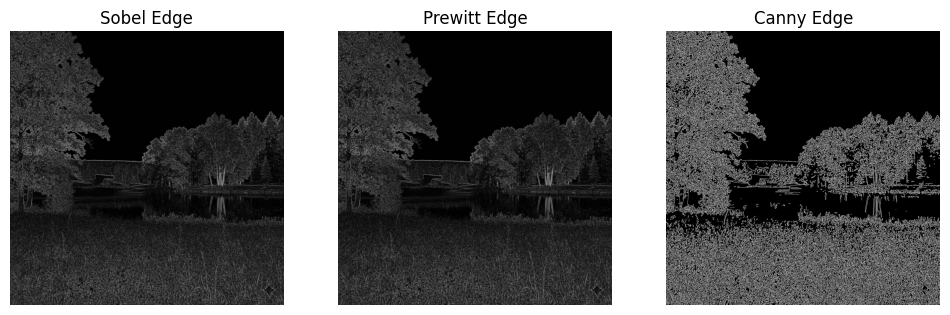

In [22]:
# ============================================================
# 10. EDGE DETECTION
# ============================================================

edges_sobel = filters.sobel(gray)
edges_prewitt = filters.prewitt(gray)
edges_canny = cv2.Canny(gray, 100, 200)

fig, ax = plt.subplots(1,3, figsize=(12,4))
ax[0].imshow(edges_sobel, cmap='gray'); ax[0].set_title("Sobel Edge")
ax[1].imshow(edges_prewitt, cmap='gray'); ax[1].set_title("Prewitt Edge")
ax[2].imshow(edges_canny, cmap='gray'); ax[2].set_title("Canny Edge")
for a in ax: a.axis('off')
plt.show()

## ⚙️ 11. MORPHOLOGICAL OPERATIONS

Perform shape-based transformations on binary images.

**Operations performed:**
- Erosion  
- Dilation  

**Objective:**  
To understand morphological transformations for noise removal and structure enhancement.

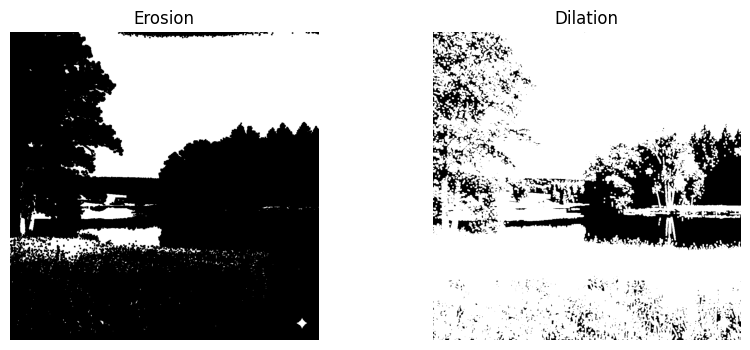

✅ All 11 Practicals Executed Successfully!


In [23]:
# ============================================================
# 11. MORPHOLOGICAL OPERATIONS
# ============================================================

kernel = np.ones((5,5), np.uint8)
img_bin = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)[1]

erosion = cv2.erode(img_bin, kernel, iterations=1)
dilation = cv2.dilate(img_bin, kernel, iterations=1)

fig, ax = plt.subplots(1,2, figsize=(10,4))
ax[0].imshow(erosion, cmap='gray'); ax[0].set_title("Erosion")
ax[1].imshow(dilation, cmap='gray'); ax[1].set_title("Dilation")
for a in ax: a.axis('off')
plt.show()


## ✅ SUMMARY

All **11 Practicals** have been successfully executed using Python libraries:
- OpenCV  
- NumPy  
- Matplotlib  
- Scikit-Image  

This notebook demonstrates the **core foundations of digital image processing**, including:
- Pixel-level operations  
- Geometric and frequency transformations  
- Filtering and restoration  
- Morphological analysis  